# DOWJones Indutrial Average Index Analysis

# Portfolio Analysis

In [1]:
# Importing functions
import requests
import numpy as np
import pandas as pd
import yfinance as yf
import plotly.express as px
from datetime import datetime
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from keras.callbacks import EarlyStopping

In [2]:
# Reading the data

df = pd.read_csv("Stocks_in_DJI.csv")
df.head()

,Date,AAPL_close,AMGN_close,AXP_close,BA_close,CAT_close,CRM_close,CSCO_close,CVX_close,DIS_close,...,MSFT_close,NKE_close,PG_close,TRV_close,UNH_close,V_close,VZ_close,WBA_close,WMT_close,^DJI_close
0,01-09-2020,131.624268,226.441727,98.125130,172.100006,136.140167,281.250000,38.061466,72.253700,133.550003,...,220.748138,111.482742,127.560051,106.449974,298.787079,208.483261,49.459633,31.200165,140.890747,28645.66016
1,02-09-2020,128.897232,232.995041,99.973289,174.779999,139.141678,276.690002,38.414635,72.349373,135.389999,...,225.002441,113.385468,129.710968,109.039520,305.864502,211.541870,50.605003,31.548164,140.976669,29100.50000
2,03-09-2020,118.577606,223.778870,100.030739,168.770004,136.802002,265.010010,37.083443,71.557922,133.240005,...,211.064255,109.550919,127.633904,107.062561,302.034515,204.193390,50.671875,31.480255,137.979187,28292.73047
3,04-09-2020,118.656090,224.221146,101.189438,171.050003,138.125626,254.699997,36.965721,71.253563,131.990005,...,208.101746,109.114075,127.356979,108.194908,297.994354,199.991516,50.563190,31.310513,136.346787,28133.31055
4,08-09-2020,110.671135,217.703964,99.274246,161.080002,138.442581,241.270004,36.223148,68.679276,134.199997,...,196.844345,109.424728,125.492218,105.568222,293.457581,195.555069,50.128452,30.639986,132.165604,27500.89063


### Stocks VS Market Growth Rate

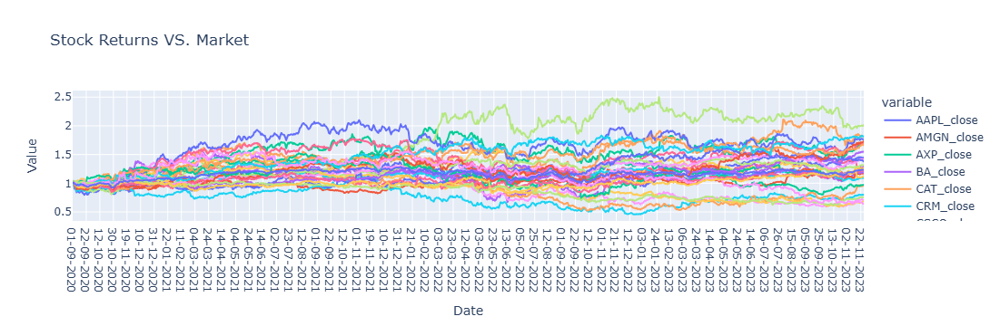

None


In [3]:
# Returns df
returns_df = df.copy()
returns_df.set_index(returns_df.columns[0], inplace=True)
returns_df = returns_df.pct_change(periods=1)
returns_df = returns_df.fillna(0)

# cumulative Growth df

cumulative_growth_df = returns_df.copy()
for i in cumulative_growth_df.columns:
    cumulative_growth_df[i] = (cumulative_growth_df[i] + 1).cumprod()
fig = px.line(cumulative_growth_df, x=cumulative_growth_df.index, y=cumulative_growth_df.columns,
              labels={'date': 'Date', 'value': 'Value'},
              title='Stock Returns VS. Market')
print(fig.show())

In [4]:
y = -float('inf')
company_growth_rates = {}

# Finding the company with the highest cumulative growth

for i in cumulative_growth_df.columns:
    if y <= cumulative_growth_df[i].iloc[-1]:
        y = cumulative_growth_df[i].iloc[-1]
        x = i.replace("_close", "")
print("The company with the highest cumulative growth is", x, "with a cumulative growth rate of", str(y) + ".")
print("----------------------")

v = cumulative_growth_df["^DJI_close"].iloc[-1]

for i in cumulative_growth_df.columns:
    if i != "^DJI_close":
        if v < cumulative_growth_df[i].iloc[-1]:
            company_growth_rates[i.replace("_close", "")] = cumulative_growth_df[i].iloc[-1]
print("The following companies have a higher growth rate than the SPY over the given period:")
for company, growth_rate in sorted(company_growth_rates.items(), key=lambda x: x[1], reverse=True):
    print(f"{company}: {growth_rate}")
print("----------------------")

w = cumulative_growth_df["^DJI_close"].iloc[-1]
lower_growth_companies = {}
for i in cumulative_growth_df.columns:
    if i != "^DJI_close":
        if w > cumulative_growth_df[i].iloc[-1]:
            lower_growth_companies[i.replace("_close", "")] = cumulative_growth_df[i].iloc[-1]
print("The following companies have a lower growth rate than the SPY over the given period:")
for company, growth_rate in sorted(lower_growth_companies.items(), key=lambda x: x[1], reverse=True):
    print(f"{company}: {growth_rate}")

The company with the highest cumulative growth is CVX with a cumulative growth rate of 2.0138760226312584.
----------------------
The following companies have a higher growth rate than the SPY over the given period:
CVX: 2.0138760226312584
CAT: 1.8179792568963402
UNH: 1.809081006079608
GS: 1.7659024130625713
MSFT: 1.733650009344771
AXP: 1.6882525832727575
JPM: 1.68519047012205
TRV: 1.6612497823050223
IBM: 1.5488496347519825
AAPL: 1.4465417158378195
MCD: 1.4183820647663672
MRK: 1.3781393281432412
KO: 1.3169598634462376
BA: 1.2920975433945694
DOW: 1.2643137321940292
CSCO: 1.2571769619546718
----------------------
The following companies have a lower growth rate than the SPY over the given period:
HON: 1.2329372803188292
V: 1.2132389001660684
PG: 1.1938690217362813
HD: 1.1835062449990632
AMGN: 1.172575359097895
WMT: 1.1259788358379712
JNJ: 1.0923900154492439
NKE: 0.9754873064330779
INTC: 0.9574756549424314
CRM: 0.7997155491555559
VZ: 0.7575875324122662
DIS: 0.6926244691341416
MMM: 0.68764

### Correlation Analysis

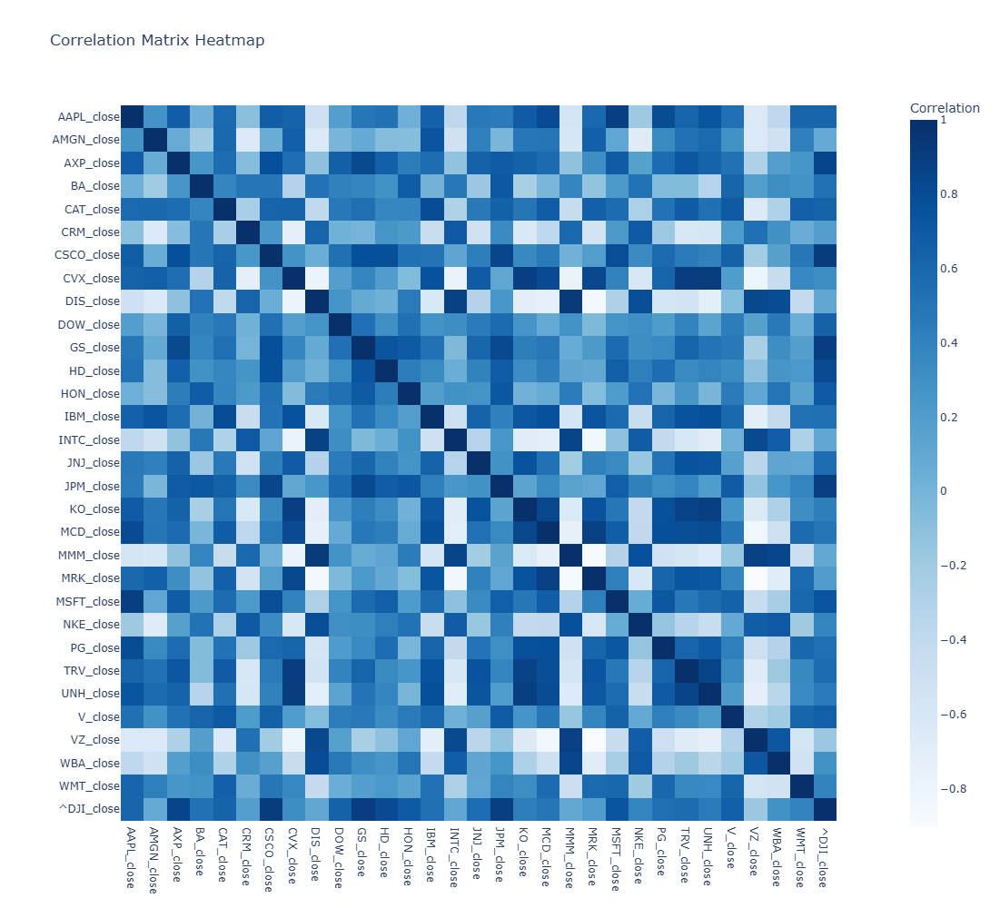

The following companies have high positive correlation:
AAPL MCD 0.8029302219976918
AAPL MSFT 0.8943737703606315
AAPL PG 0.7999116904351397
AXP CSCO 0.7769395590257979
AXP GS 0.8216068573966017
CAT IBM 0.7976868452450558
CSCO GS 0.7788048400170736
CSCO HD 0.7770106138278505
CSCO JPM 0.8507959343398678
CSCO MSFT 0.7945335472410765
CVX IBM 0.7640296200824784
CVX KO 0.8903752000520392
CVX MCD 0.8058134225721405
CVX MRK 0.8313393091542725
CVX TRV 0.9017239109414372
CVX UNH 0.9059338852866193
DIS INTC 0.8782873576350695
DIS MMM 0.9264102545868385
DIS NKE 0.7855246041445785
DIS VZ 0.8294726685301547
DIS WBA 0.7958651995489568
GS JPM 0.8216053374034623
IBM MCD 0.7730626285554093
IBM TRV 0.7570856299649417
IBM UNH 0.777895623466946
INTC MMM 0.8579924396572397
INTC VZ 0.8227611483059293
JNJ KO 0.7570714243992739
JNJ TRV 0.7524746158761133
KO MCD 0.8378878272117677
KO MRK 0.7536966209302929
KO PG 0.7729207219679676
KO TRV 0.8658909708579396
KO UNH 0.8923844761049492
MCD MRK 0.8867361085488175
MC

In [5]:
# Correlation Analysis
df_corr = df.copy()
df_corr.set_index(df_corr.columns[0], inplace=True)

correlation_matrix = df_corr.corr()
fig = px.imshow(
    correlation_matrix,
    labels=dict(color="Correlation"),
    x=correlation_matrix.index,
    y=correlation_matrix.columns,
    color_continuous_scale='blues',
    title='Correlation Matrix Heatmap',
    height=1000,
    width=1000
)
fig.show()
print("The following companies have high positive correlation:")
a = float('-inf')
ticker1 = None
ticker2 = None
printed_pairs = set()
for i in correlation_matrix.columns:
    for j in correlation_matrix.index:
        if i != j and i != '^DJI_close' and j != '^DJI_close':
            if correlation_matrix.loc[j, i] >= 0.75:
                a = correlation_matrix.loc[j, i]
                ticker1 = i.replace("_close", "")
                ticker2 = j.replace("_close", "")
                pair = tuple(sorted((ticker1, ticker2)))
                if pair not in printed_pairs:
                    printed_pairs.add(pair)
                    print(ticker1, ticker2, a)
print("----------------------")
print("The following companies have high negative correlation:")
a = float('-inf')
ticker1 = None
ticker2 = None
printed_pairs = set()
for i in correlation_matrix.columns:
    for j in correlation_matrix.index:
        if i != j and i != '^DJI_close' and j != '^DJI_close':
            if correlation_matrix.loc[j, i] <= -0.75:
                a = correlation_matrix.loc[j, i]
                ticker1 = i.replace("_close", "")
                ticker2 = j.replace("_close", "")
                pair = tuple(sorted((ticker1, ticker2)))
                if pair not in printed_pairs:
                    printed_pairs.add(pair)
                    print(ticker1, ticker2, a)
print("----------------------")
print("The following companies have a high correlation with the market:")
a = float('-inf')
ticker1 = None
ticker2 = None
printed_pairs = set()
for i in correlation_matrix.columns:
    for j in correlation_matrix.index:
        if i != j and i != '^DJI_close' and j == '^DJI_close':
            if correlation_matrix.loc[j, i] >= 0.75:
                a = correlation_matrix.loc[j, i]
                ticker1 = i.replace("_close", "")
                ticker2 = j.replace("_close", "")
                pair = tuple(sorted((ticker1, ticker2)))
                if pair not in printed_pairs:
                    printed_pairs.add(pair)
                    print(ticker1, ticker2, a)
print("----------------------")
print("The following companies have a low or negative correlation with the market:")
a = float('-inf')
ticker1 = None
ticker2 = None
printed_pairs = set()
for i in correlation_matrix.columns:
    for j in correlation_matrix.index:
        if i != j and i != '^DJI_close' and j == '^DJI_close':
            if correlation_matrix.loc[j, i] <= 0.25:
                a = correlation_matrix.loc[j, i]
                ticker1 = i.replace("_close", "")
                ticker2 = j.replace("_close", "")
                pair = tuple(sorted((ticker1, ticker2)))
                if pair not in printed_pairs:
                    printed_pairs.add(pair)
                    print(ticker1, ticker2, a)
print("----------------------")

### Market Beta

In [ ]:
# Calculating Beta
beta_list = []

for symbol in ticker_list:
    cov_mat = returns_df.cov()
    cov = cov_mat.loc[symbol + "_close", "^DJI_close"]
    var = returns_df["^DJI_close"].var()
    beta = cov / var
    beta_list.append((symbol, beta))

# Sort the beta list in descending order based on beta values
beta_list.sort(key=lambda x: x[1], reverse=True)

# Print the results
print("Beta greater than 1:")
for symbol, beta in beta_list:
    if round(beta, 3) >= 1.000:
        print(f"BETA OF {symbol} WITH RESPECT TO THE MARKET:", round(beta, 3))
print("----------------------")
print("Beta less than 1 but greater than 0.5:")
for symbol, beta in beta_list:
    if round(beta, 3) < 1.000 and round(beta, 3) >= 0.500:
        print(f"BETA OF {symbol} WITH RESPECT TO THE MARKET:", round(beta, 3))
print("----------------------")
print("Beta less than 0.5:")
for symbol, beta in beta_list:
    if round(beta, 3) < 0.500:
        print(f"BETA OF {symbol} WITH RESPECT TO THE MARKET:", round(beta, 3))

Beta greater than 1:
BETA OF BA WITH RESPECT TO THE MARKET: 1.609
BETA OF AXP WITH RESPECT TO THE MARKET: 1.489
BETA OF CRM WITH RESPECT TO THE MARKET: 1.342
BETA OF DIS WITH RESPECT TO THE MARKET: 1.277
BETA OF GS WITH RESPECT TO THE MARKET: 1.271
BETA OF INTC WITH RESPECT TO THE MARKET: 1.267
BETA OF AAPL WITH RESPECT TO THE MARKET: 1.266
BETA OF NKE WITH RESPECT TO THE MARKET: 1.251
BETA OF CAT WITH RESPECT TO THE MARKET: 1.206
BETA OF JPM WITH RESPECT TO THE MARKET: 1.202
BETA OF MSFT WITH RESPECT TO THE MARKET: 1.201
BETA OF DOW WITH RESPECT TO THE MARKET: 1.169
BETA OF V WITH RESPECT TO THE MARKET: 1.145
BETA OF HON WITH RESPECT TO THE MARKET: 1.112
BETA OF HD WITH RESPECT TO THE MARKET: 1.048
BETA OF WBA WITH RESPECT TO THE MARKET: 1.037
----------------------
Beta less than 1 but greater than 0.5:
BETA OF CSCO WITH RESPECT TO THE MARKET: 0.979
BETA OF MMM WITH RESPECT TO THE MARKET: 0.965
BETA OF CVX WITH RESPECT TO THE MARKET: 0.959
BETA OF TRV WITH RESPECT TO THE MARKET: 0.84

### Portfolio Analysis

In [ ]:
# Calculate daily returns
returns = df.copy()
returns.set_index(returns.columns[0], inplace=True)
returns = returns.drop(['^DJI_close', 'VZ_close'], axis=1)
returns = returns.pct_change().dropna()
# Calculate portfolio returns
weights = np.array([3.497093,4.877678,3.157287,4.52322,5.0339,4.540343,0.872729,2.646606,1.658255,0.957283,6.76912,6.210248,3.59065,2.875733,0.79753,2.769113,
                    2.894797,1.042191,5.119514,1.8895,1.869023,6.459499,2.136279,2.553579,3.226307,9.430554,4.567174,0.443778,2.686147])
weights = (weights / np.sum(weights)) * 100
weights = weights/100
# Returns
portfolio_returns = np.dot(returns, weights)
benchmark_returns = df.copy()
benchmark_returns.set_index(benchmark_returns.columns[0], inplace=True)
benchmark_returns = benchmark_returns['^DJI_close'].pct_change().dropna()
# Cumulative Returns
portfolio_cumulative_returns = (1 + portfolio_returns).cumprod() - 1
benchmark_cumulative_returns = (1 + benchmark_returns).cumprod() - 1
# Plotting
df_plot = pd.DataFrame({
    'Portfolio': portfolio_cumulative_returns,
    'Benchmark': benchmark_cumulative_returns
})
df_plot.reset_index(inplace=True)
# Create an interactive line plot using Plotly Express
fig = px.line(df_plot, x='Date', y=['Portfolio', 'Benchmark'], labels={'value': 'Cumulative Returns'}, title='Portfolio vs Benchmark Cumulative Returns')
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Cumulative Returns',
    legend_title='Portfolio',
)
fig.show()
# Comparing the portfolios
portfolio_total_return = portfolio_cumulative_returns[-1]
benchmark_total_return = benchmark_cumulative_returns[-1]
portfolio_annualized_return = np.mean(portfolio_returns) * 252
benchmark_annualized_return = np.mean(benchmark_returns) * 252
portfolio_volatility = np.std(portfolio_returns) * np.sqrt(252)
benchmark_volatility = np.std(benchmark_returns) * np.sqrt(252)
portfolio_sharpe_ratio = portfolio_annualized_return / portfolio_volatility
benchmark_sharpe_ratio = benchmark_annualized_return / benchmark_volatility
print("Portfolio Performance Metrics:")
print(f"Total Return: {portfolio_total_return:.4f}")
print(f"Annualized Return: {portfolio_annualized_return:.4f}")
print(f"Volatility: {portfolio_volatility:.4f}")
print(f"Sharpe Ratio: {portfolio_sharpe_ratio:.4f}")
print("----------------------")
print("Benchmark Performance Metrics:")
print(f"Total Return: {benchmark_total_return:.4f}")
print(f"Annualized Return: {benchmark_annualized_return:.4f}")
print(f"Volatility: {benchmark_volatility:.4f}")
print(f"Sharpe Ratio: {benchmark_sharpe_ratio:.4f}")
print("----------------------")

Portfolio Performance Metrics:
Total Return: 0.4746
Annualized Return: 0.1328
Volatility: 0.1593
Sharpe Ratio: 0.8338
----------------------
Benchmark Performance Metrics:
Total Return: 0.2364
Annualized Return: 0.0776
Volatility: 0.1546
Sharpe Ratio: 0.5019
----------------------


### Short-term Bollinger Bands

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

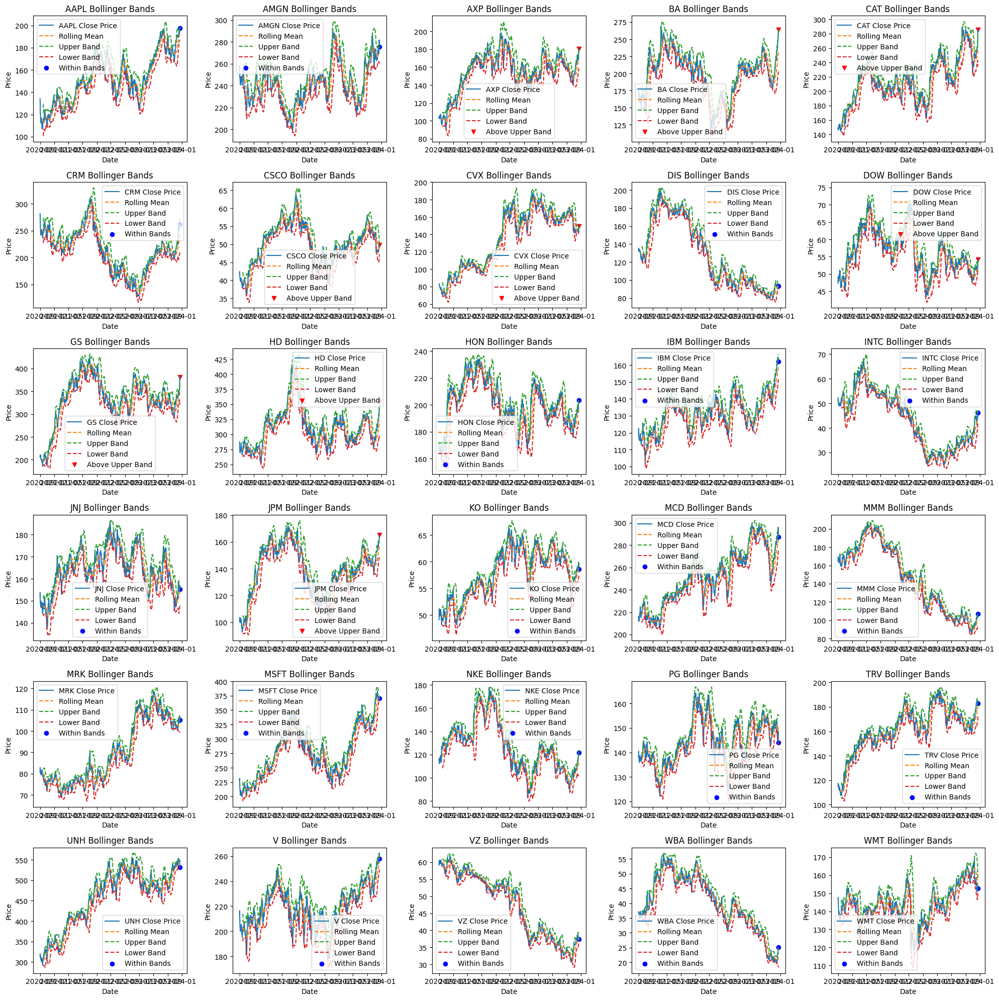

Symbols above upper band: ['AXP', 'BA', 'CAT', 'CSCO', 'CVX', 'DOW', 'GS', 'HD', 'JPM']
Symbols below lower band: []
Symbols between bands: ['AAPL', 'AMGN', 'CRM', 'DIS', 'HON', 'IBM', 'INTC', 'JNJ', 'KO', 'MCD', 'MMM', 'MRK', 'MSFT', 'NKE', 'PG', 'TRV', 'UNH', 'V', 'VZ', 'WBA', 'WMT']


In [ ]:
# Bollinger Bands Short Term
def bollinger_bands(ax, symbol, start_date, end_date, window_size=20, num_std_dev=2, above_upper_band_list=None, below_lower_band_list=None, between_bands_list=None):
    if above_upper_band_list is None:
        above_upper_band_list = []
    if below_lower_band_list is None:
        below_lower_band_list = []
    if between_bands_list is None:
        between_bands_list = []

    # Stock Data Extraction
    data = yf.download(symbol, start=start_date, end=end_date)
    # Data for Bollinger Bands
    data['Rolling Mean'] = data['Close'].rolling(window=window_size).mean()
    data['Upper Band'] = data['Rolling Mean'] + (data['Close'].rolling(window=window_size).std() * num_std_dev)
    data['Lower Band'] = data['Rolling Mean'] - (data['Close'].rolling(window=window_size).std() * num_std_dev)
    # Plot Bollinger Bands
    ax.plot(data['Close'], label=f'{symbol} Close Price')
    ax.plot(data['Rolling Mean'], label='Rolling Mean', linestyle='--')
    ax.plot(data['Upper Band'], label='Upper Band', linestyle='--')
    ax.plot(data['Lower Band'], label='Lower Band', linestyle='--')
    last_day_index = len(data) - 1
    last_day_close = data['Close'].iloc[last_day_index]
    upper_band_last_day = data['Upper Band'].iloc[last_day_index]
    lower_band_last_day = data['Lower Band'].iloc[last_day_index]

    if last_day_close > upper_band_last_day:
        ax.scatter(data.index[last_day_index], last_day_close, color='red', marker='v', label='Above Upper Band')
        above_upper_band_list.append(symbol)
    elif last_day_close < lower_band_last_day:
        ax.scatter(data.index[last_day_index], last_day_close, color='green', marker='^', label='Below Lower Band')
        below_lower_band_list.append(symbol)
    else:
        ax.scatter(data.index[last_day_index], last_day_close, color='blue', marker='o', label='Within Bands')
        between_bands_list.append(symbol)

    ax.set_title(f'{symbol} Bollinger Bands')
    ax.set_xlabel('Date')
    ax.set_ylabel('Price')
    ax.legend()

# Plotting
fig, axs = plt.subplots(6, 5, figsize=(20, 20))
axs = axs.flatten()

# Lists to store symbols above upper band, below lower band, and between bands
above_upper_band_list = []
below_lower_band_list = []
between_bands_list = []

# Request URL and Parsing the HTML content using BeautifulSoup
Ticker_URL = "https://stockmarketmba.com/stocksinthedjia.php"
request = requests.get(Ticker_URL)
soup = BeautifulSoup(request.text, 'html.parser')
# Extracting the values
ticker = soup.find_all("tr")
# Creating the list of tickers
ticker_list = []
for i in ticker:
    if i.find("a") is not None:
        ticker_list.append(i.find("a").text)
# Cleaning the list of tickers
ticker_list = sorted(ticker_list)

# Loop through the tickers and plot on each subplot
for i, symbol in enumerate(ticker_list):
    start = datetime(2020, 9, 1)
    end = datetime.now()
    bollinger_bands(axs[i], symbol, start, end, window_size=20, num_std_dev=2, above_upper_band_list=above_upper_band_list, below_lower_band_list=below_lower_band_list, between_bands_list=between_bands_list)

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

# Display symbols in different categories
print("Symbols above upper band:", above_upper_band_list)
print("Symbols below lower band:", below_lower_band_list)
print("Symbols between bands:", between_bands_list)

### Long-term Bollinger Bands

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

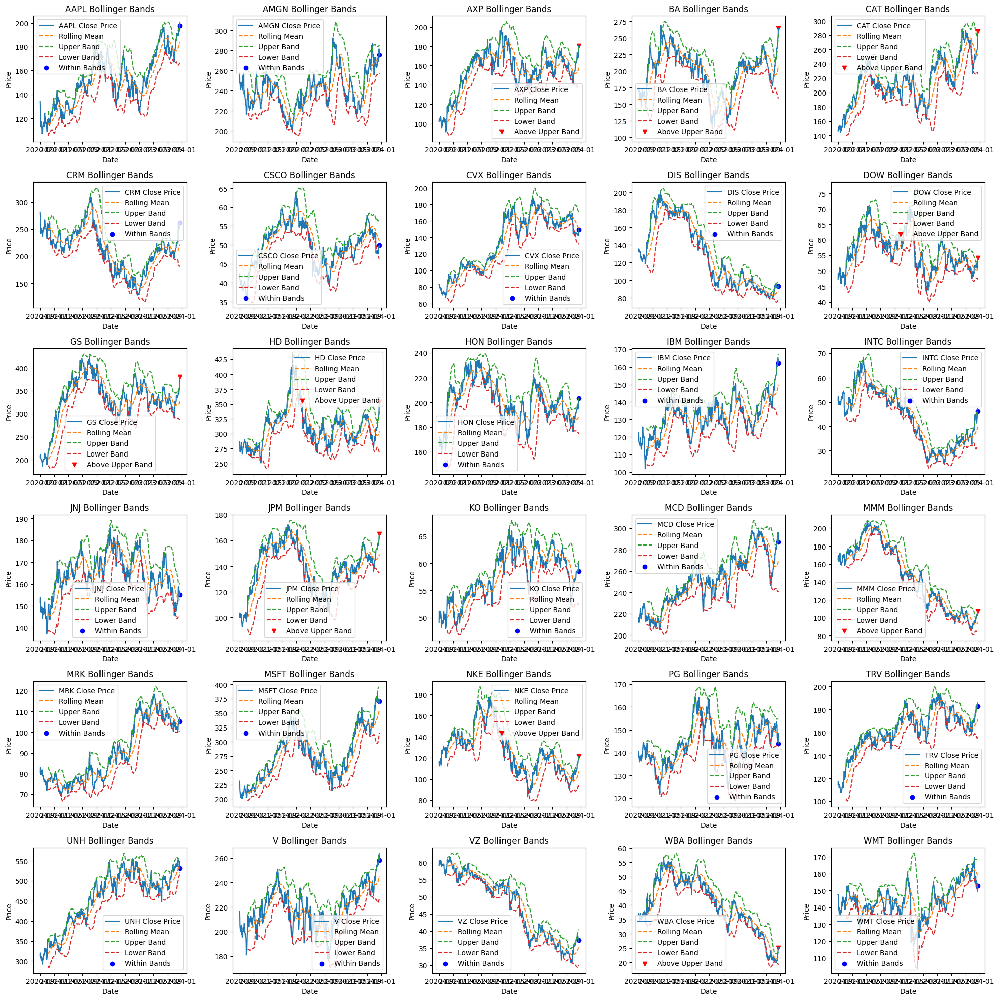

Symbols above upper band: ['AXP', 'BA', 'CAT', 'DOW', 'GS', 'HD', 'JPM', 'MMM', 'NKE', 'WBA']
Symbols below lower band: []
Symbols between bands: ['AAPL', 'AMGN', 'CRM', 'CSCO', 'CVX', 'DIS', 'HON', 'IBM', 'INTC', 'JNJ', 'KO', 'MCD', 'MRK', 'MSFT', 'PG', 'TRV', 'UNH', 'V', 'VZ', 'WMT']


In [ ]:
# Bollinger Bands Long Term
# Plotting
fig, axs = plt.subplots(6, 5, figsize=(20, 20))
axs = axs.flatten()

# Lists to store symbols above upper band, below lower band, and between bands
above_upper_band_list_LT = []
below_lower_band_list_LT = []
between_bands_list_LT = []

# Loop through the tickers and plot on each subplot
for i, symbol in enumerate(ticker_list):
    start = datetime(2020, 9, 1)
    end = datetime.now()
    bollinger_bands(axs[i], symbol, start, end, window_size=50, num_std_dev=2, above_upper_band_list=above_upper_band_list_LT, below_lower_band_list=below_lower_band_list_LT, between_bands_list=between_bands_list_LT)

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

# Display symbols in different categories
print("Symbols above upper band:", above_upper_band_list_LT)
print("Symbols below lower band:", below_lower_band_list_LT)
print("Symbols between bands:", between_bands_list_LT)

# DJIA - Time Series Analysis and Prediction using LSTM

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/DJI_Stock_Since_Start (2).csv')

In [ ]:
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1992-01-02,3152.100098,3172.629883,3139.310059,3172.399902,3172.399902,23550000
1,1992-01-03,3172.399902,3210.639893,3165.919922,3201.500000,3201.500000,23620000
2,1992-01-06,3201.500000,3213.330078,3191.860107,3200.100098,3200.100098,27280000
3,1992-01-07,3200.100098,3210.199951,3184.479980,3204.800049,3204.800049,25510000
4,1992-01-08,3204.800049,3229.199951,3185.820068,3203.899902,3203.899902,29040000


In [ ]:
df.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df.set_index('Date', inplace=True)

## Time Series Analysis on DJIA

### Visualization

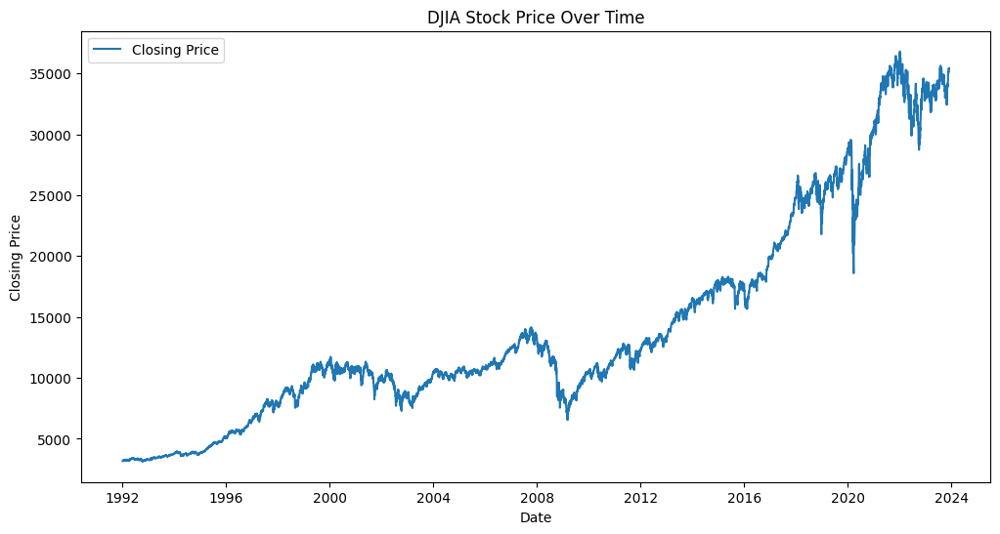

In [ ]:
## Time Series Visuals

plt.figure(figsize=(12, 6))
plt.plot(df['Close'], label='Closing Price')
plt.title('DJIA Stock Price Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.legend()
plt.show()

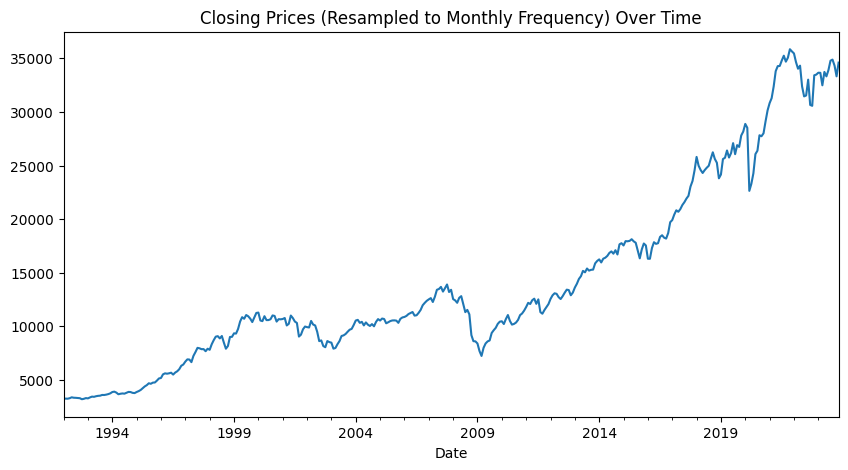

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

#Resampling data with month
df_month = df.resample('M').mean()

# Plotting the closing prices after resampling
df_month['Close'].plot(figsize=(10,5))
plt.title('Closing Prices (Resampled to Monthly Frequency) Over Time')
plt.show()

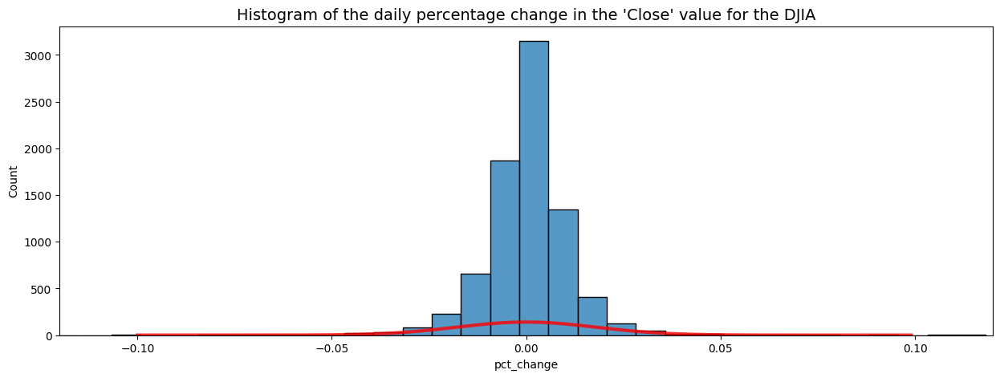

In [ ]:
df['pct_change'] = df.Close.pct_change(periods = 1)

x = np.arange(-0.1, 0.1, 0.001)

def Gaussian(x,mu,sigma,A):
    return A*np.exp(-0.5 * ((x-mu)/sigma)**2)

plt.figure(figsize = (15,5))
ax = sns.histplot(df['pct_change'], binwidth=0.0075)
ax = plt.plot(x,Gaussian(x,0,0.018,140),color='r',lw=3,label='Gaussian #1', alpha=0.8)

plt.title("Histogram of the daily percentage change in the 'Close' value for the DJIA", size=14)
plt.xlim(-0.12, 0.12);

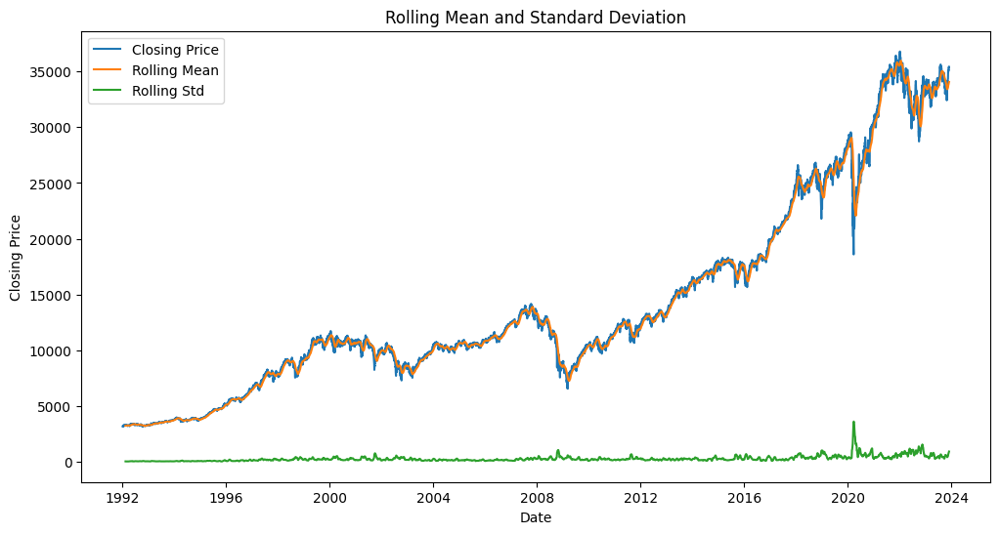

In [ ]:
rolling_mean = df['Close'].rolling(window=30).mean()
rolling_std = df['Close'].rolling(window=30).std()

plt.figure(figsize=(12, 6))
plt.plot(df['Close'], label='Closing Price')
plt.plot(rolling_mean, label='Rolling Mean')
plt.plot(rolling_std, label='Rolling Std')
plt.title('Rolling Mean and Standard Deviation')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.legend()
plt.show()

### Decomposing DJIA Time Series

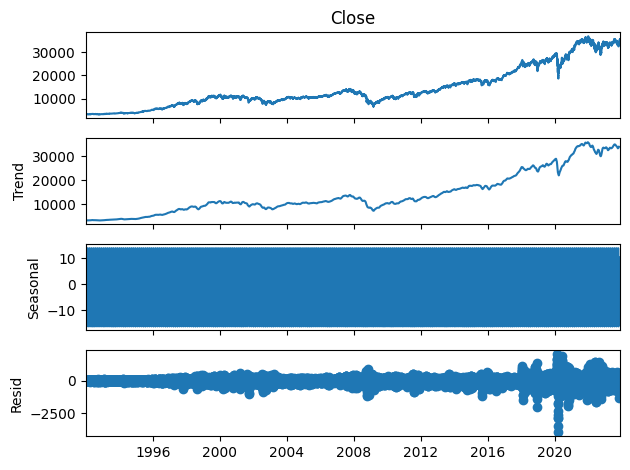

In [ ]:
import statsmodels.api as sm

decomposition = sm.tsa.seasonal_decompose(df['Close'], model='additive', period=30)
fig = decomposition.plot()
plt.show()

Decomposition of a time series data are three components: trend, seasonal, and residual.

Here’s what each component represents:

- Trend: This graph shows the underlying trend in the data when seasonality is removed. It’s a smoothed version of the Close graph showing only long-term movements.

- Seasonal: This graph illustrates regular fluctuations that occur at specific intervals. In this case, it appears as a horizontal line indicating no significant seasonal pattern detected in this dataset.

- Resid: This graph displays the residual component, which is what remains after extracting the trend and seasonal components from the original data. It indicates irregularities and anomalies not accounted for by trend or seasonality.

### Autocorrelation and Partial Autocorrelation

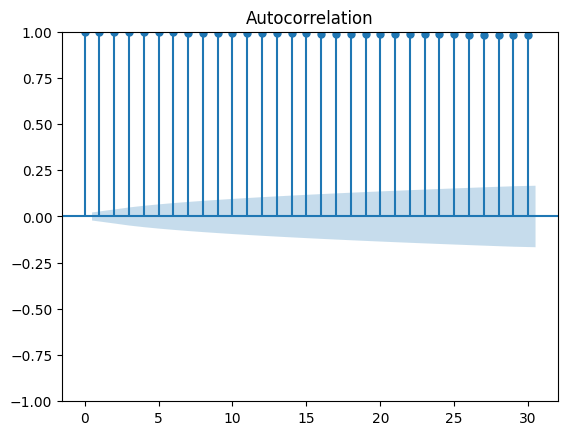

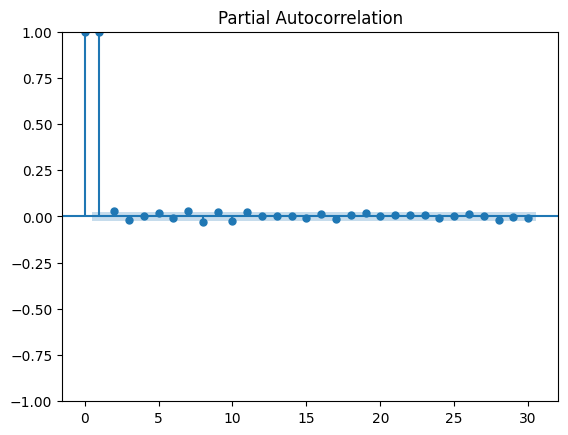

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(df['Close'], lags=30)
plt.show()

plot_pacf(df['Close'], lags=30)
plt.show()

- Autocorrelation: Autocorrelation, also known as serial correlation, is the correlation of a signal with a delayed copy of itself as a function of delay. Informally, it is the similarity between observations of a random variable as a function of the time lag between them1. It is a mathematical representation of the degree of similarity between a given time series and a lagged version of itself over successive time interval.

- Analysis - Autocorrelation:
There are vertical blue lines extending from the x-axis up to various heights, representing positive autocorrelations at different lags.
A horizontal line at y=0 serves as a baseline for distinguishing positive and negative correlations.
The area below y=0 is shaded in light blue but there are no lines extending into this area, indicating no significant negative correlations were observed.
The autocorrelation starts at 1 when the delay is zero and decreases as the delay increases, indicating that values further apart in time are less correlated. This is a common pattern in autocorrelation plots and suggests that the data may be appropriately modeled using an autoregressive or moving average model.


- Partial Autocorrelation: In time series analysis, the partial autocorrelation function (PACF) gives the partial correlation of a stationary time series with its own lagged values, regressed the values of the time series at all shorter lags. It contrasts with the autocorrelation function, which does not control for other lags. Partial autocorrelation is a measure of the correlation between a time series and a lagged version of itself after controlling for the effects of the other lags

- Analysis - Partial AutoCorrelation:
There are blue dots indicating the partial autocorrelation at each lag.
A significant spike is visible at lag 0, reaching up to a correlation value of 1.00. This is expected as a variable is perfectly correlated with itself.
Two blue horizontal lines serve as boundaries for significance levels; one is located just above 0.75 and another just below -0.25 on the y-axis.
Beyond lag 0, all other correlations are close to zero and fall within the significance boundaries. This suggests that there is no significant correlation between the variable and its lags beyond lag 0.

### Testing for Stationarity - ADF Test

In [ ]:
from statsmodels.tsa.stattools import adfuller

X = df['Close'].values

result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: 0.711919
p-value: 0.990073
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


Augmented Dickey-Fuller (ADF) test is a common statistical test used to determine whether a given Time series is stationary or not.

Here’s what the output of ADF test means:

- ADF statistic is 0.711919.

- p-value: This is the probability that you would see these results if the null hypothesis were true. In the context of the ADF test, the null hypothesis is that the time series is not stationary (has some time-dependent structure). The p-value in your case is 0.990073. If the p-value is less than a threshold (commonly 0.05), then you reject the null hypothesis and infer that the time series is indeed stationary. However, since p-value is much larger than 0.05, we fail to reject the null hypothesis and infer that your time series is not stationary.

- Critical Values: These are the test statistic values at which you can reject the null hypothesis if your test statistic is less than the critical value. If the ADF Statistic is less than the critical value, we can reject the null hypothesis (aka the series is stationary). When the ADF statistic is greater than the critical value, we fail to reject the null hypothesis (which means the series is not stationary).

In our case, because the ADF statistic is greater than all of the critical values, the test suggests that the series is non-stationary.

## ARIMA

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import itertools

In [ ]:
data = df['Close'].values

train_size = int(len(data) * 0.8)
train, test = data[:train_size], data[train_size:]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error: 80895305.20040818
Root Mean Squared Error (RMSE): 8994.181741570947


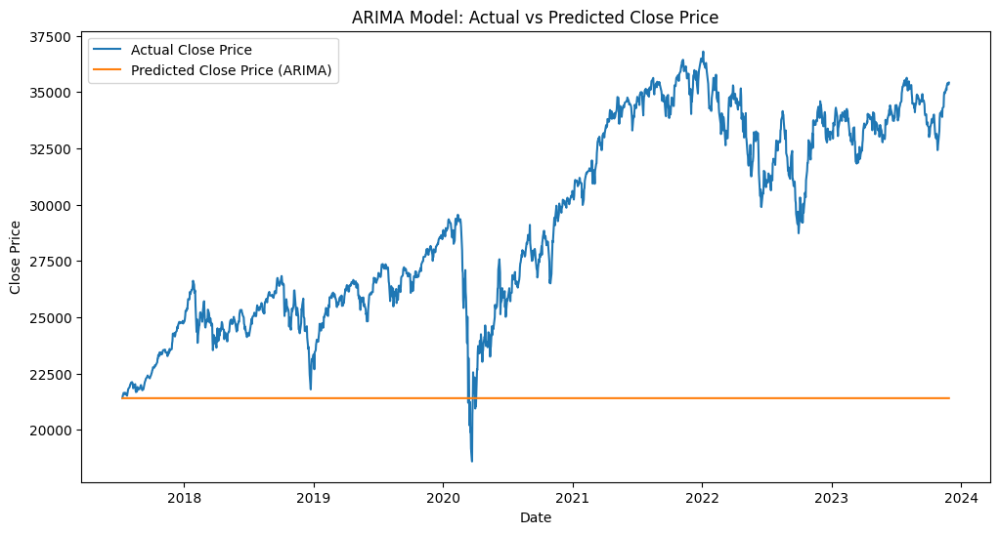

In [ ]:
order = (5, 1, 1)  # Example order parameters (p, d, q)
model = ARIMA(train, order=order)
model_fit = model.fit()

predictions = model_fit.predict(start=len(train), end=len(train) + len(test) - 1, typ='levels')

mse = mean_squared_error(test, predictions)
print(f'Mean Squared Error: {mse}')
rmse = np.sqrt(mse)
print(f'Root Mean Squared Error (RMSE): {rmse}')

plt.figure(figsize=(12, 6))
plt.plot(df.index[-len(test):], test, label='Actual Close Price')
plt.plot(df.index[-len(test):], predictions, label='Predicted Close Price (ARIMA)')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('ARIMA Model: Actual vs Predicted Close Price')
plt.legend()
plt.show()


### Finding best ARIMA Model

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=0, d=0, q=0): 374760075.8185369
Root Mean Squared Error (RMSE): 19358.72092413486


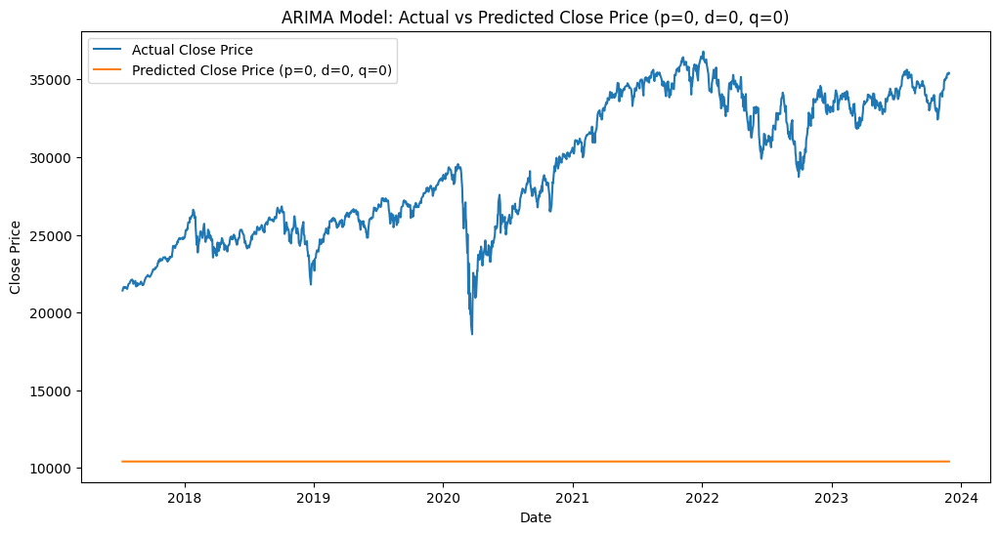

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=0, d=0, q=1): 374703781.05584717
Root Mean Squared Error (RMSE): 19357.266879801165


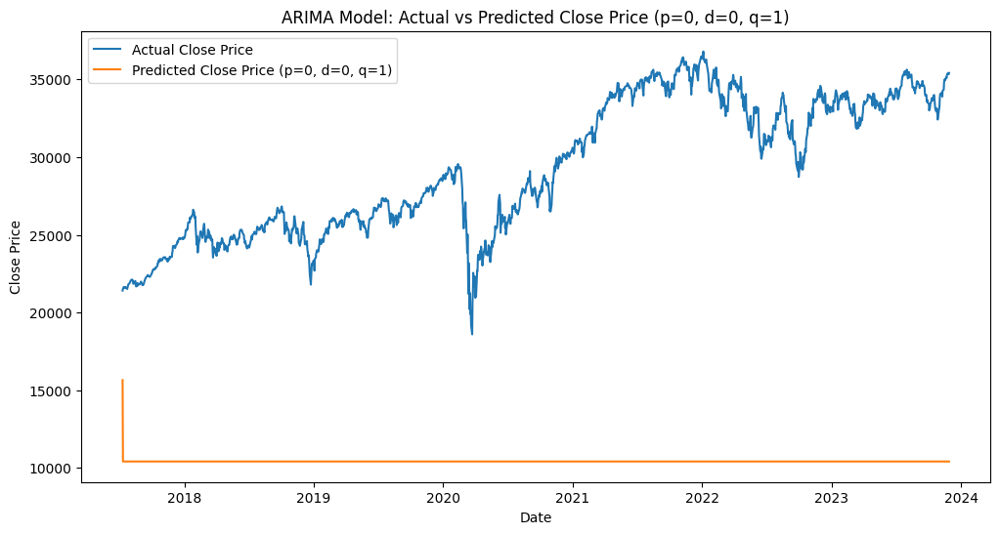

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=0, d=0, q=2): 374658829.8738247
Root Mean Squared Error (RMSE): 19356.105751773128


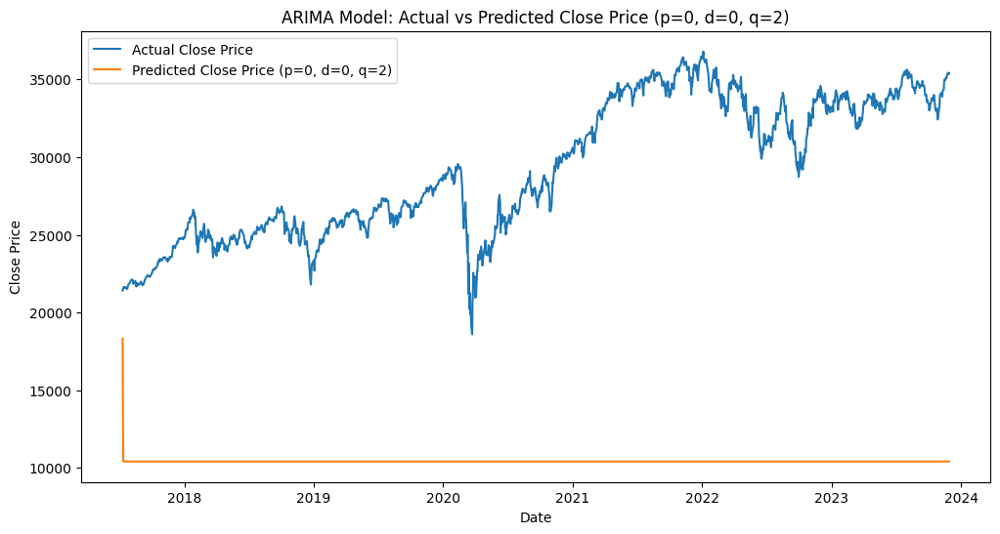

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=0, d=1, q=0): 80817248.67811397
Root Mean Squared Error (RMSE): 8989.841415626528


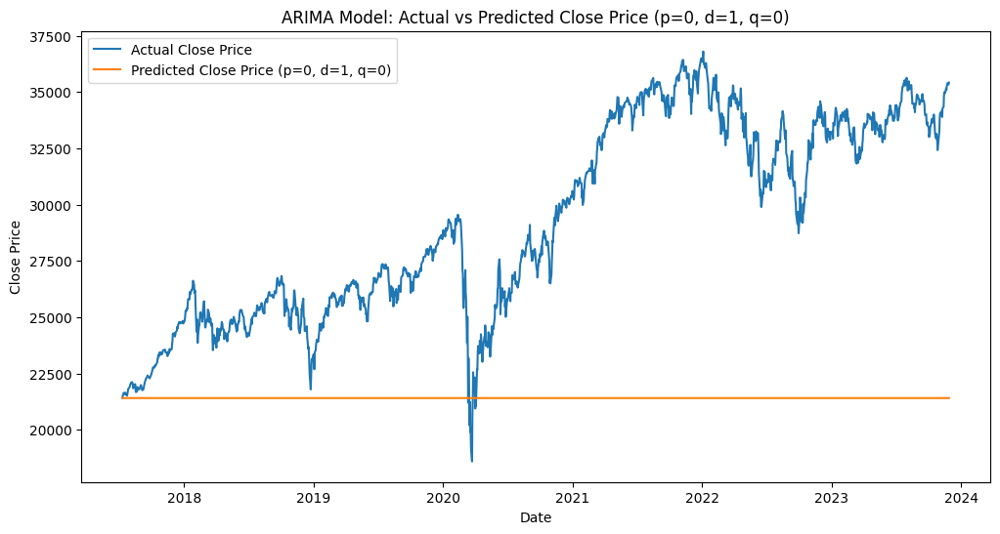

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=0, d=1, q=1): 80816450.97033505
Root Mean Squared Error (RMSE): 8989.797048339582


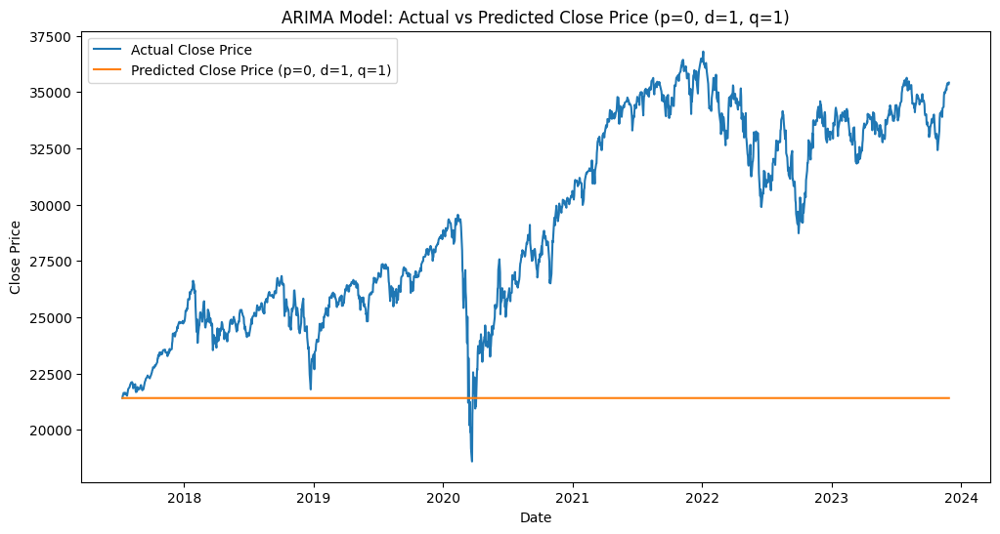

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=0, d=1, q=2): 80848119.4698963
Root Mean Squared Error (RMSE): 8991.558233693218


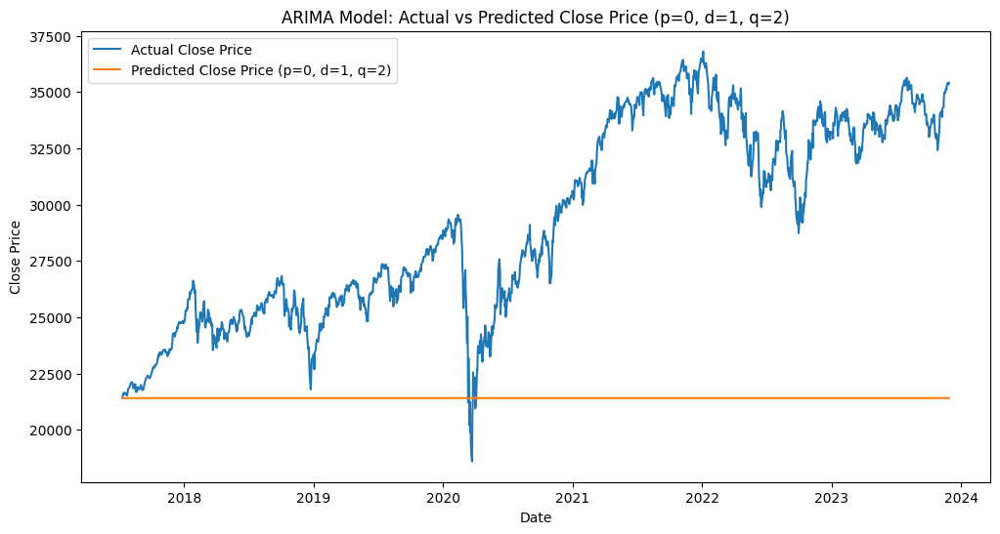

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=0, d=2, q=0): 204301211.74784404
Root Mean Squared Error (RMSE): 14293.397487925817


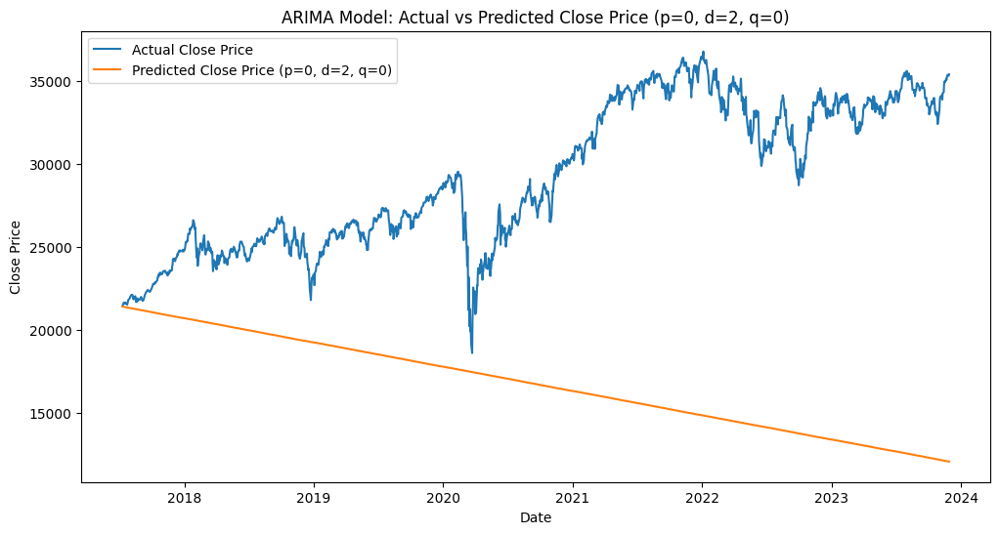

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=0, d=2, q=1): 27353804.6555172
Root Mean Squared Error (RMSE): 5230.08648642804


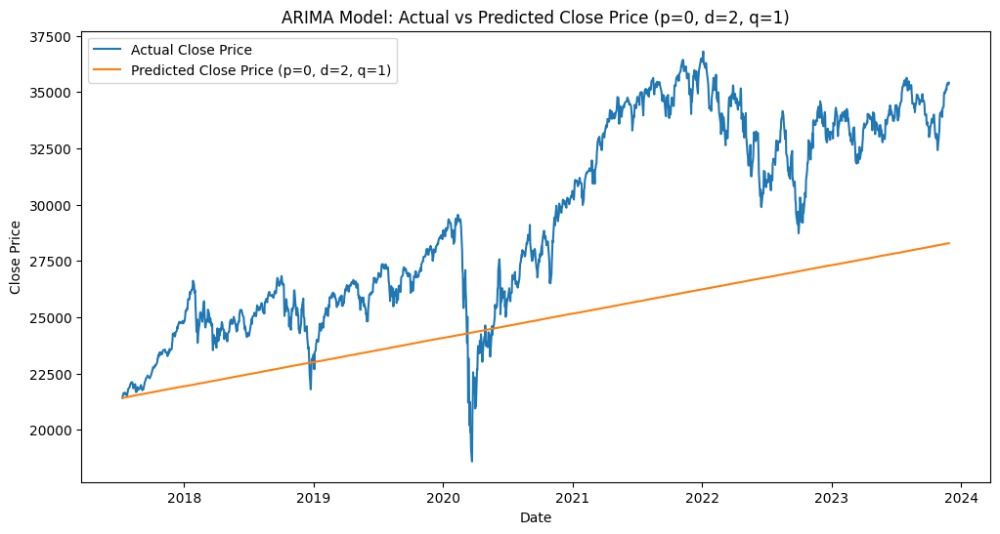

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=0, d=2, q=2): 41483518.24815371
Root Mean Squared Error (RMSE): 6440.770004289371


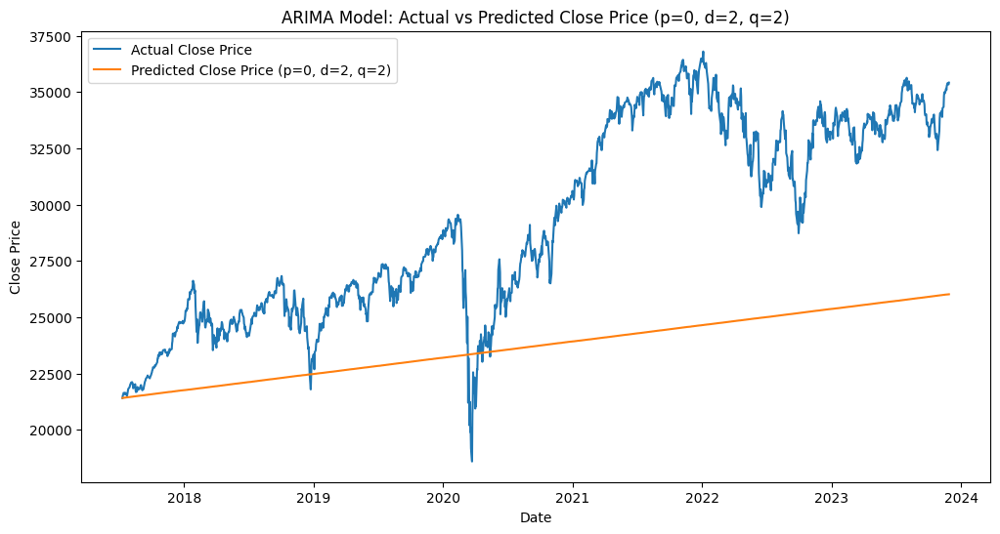

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=1, d=0, q=0): 88728297.59848738
Root Mean Squared Error (RMSE): 9419.56992640786


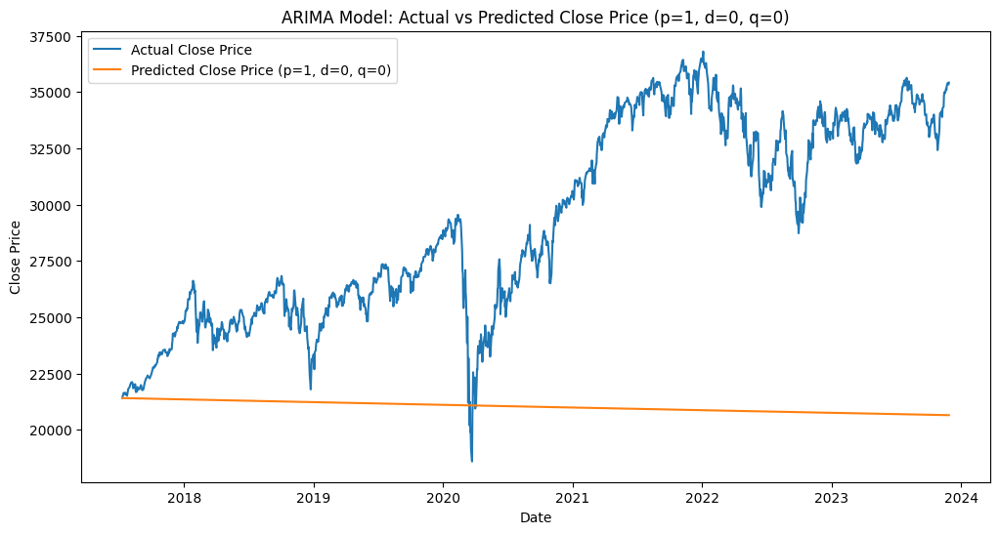

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=1, d=0, q=1): 81718121.0919699
Root Mean Squared Error (RMSE): 9039.807580472601


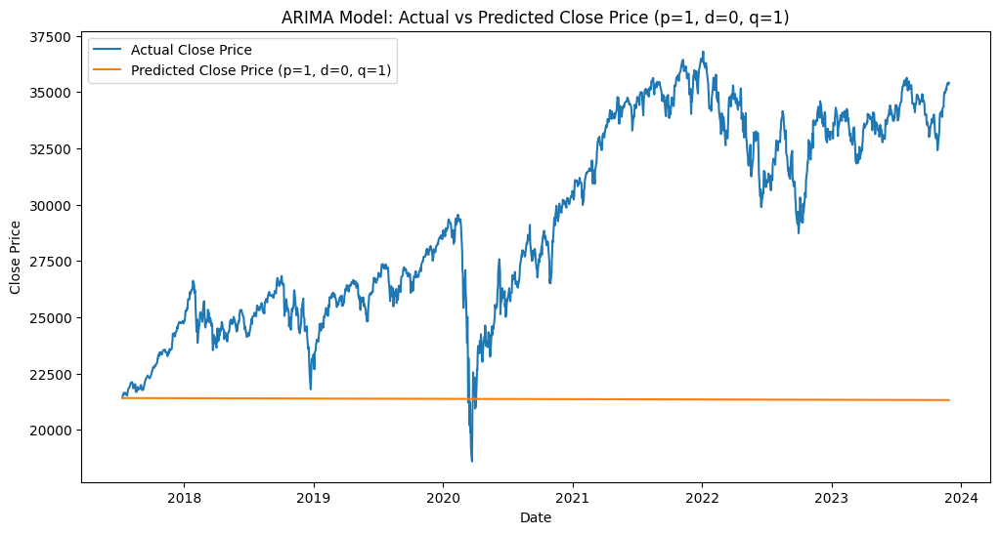

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=1, d=0, q=2): 95366150.54185699
Root Mean Squared Error (RMSE): 9765.559407522796


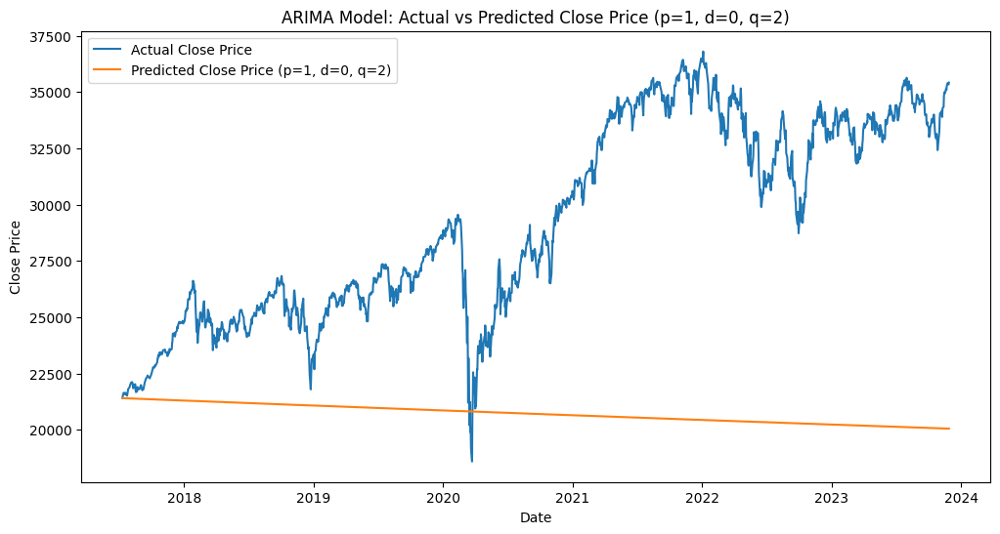

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=1, d=1, q=0): 80812498.61438547
Root Mean Squared Error (RMSE): 8989.577221114765


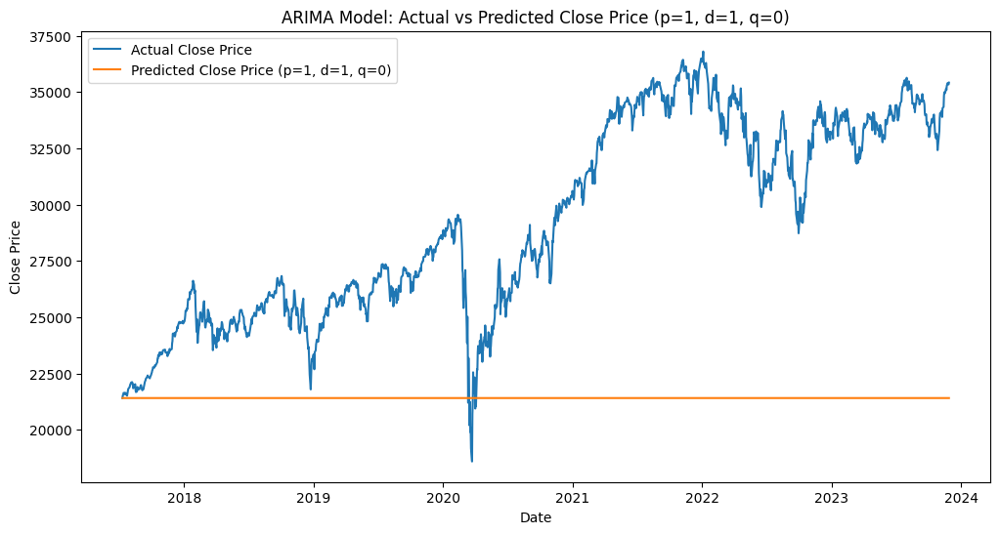

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=1, d=1, q=1): 80834952.09163456
Root Mean Squared Error (RMSE): 8990.825996071471


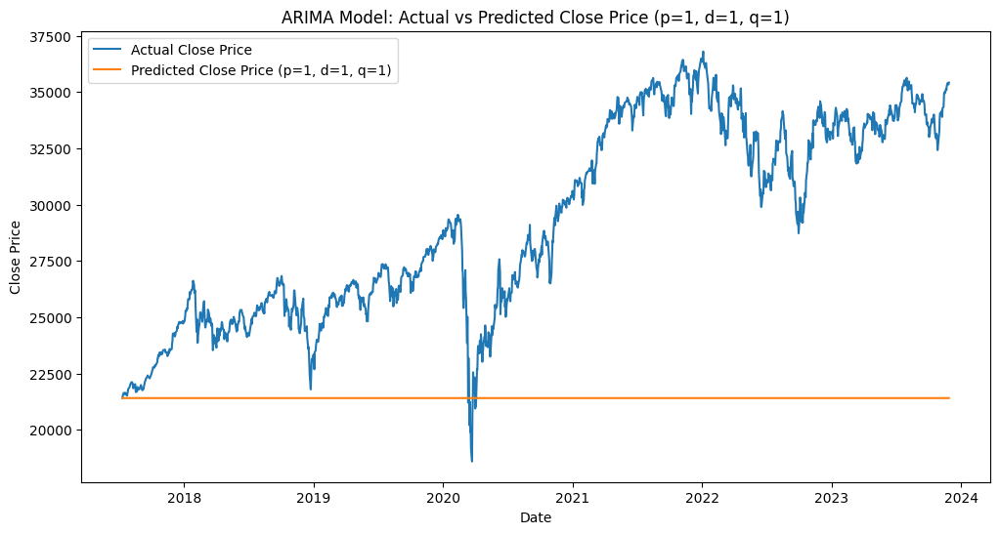

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=1, d=1, q=2): 80855438.01167202
Root Mean Squared Error (RMSE): 8991.96519186279


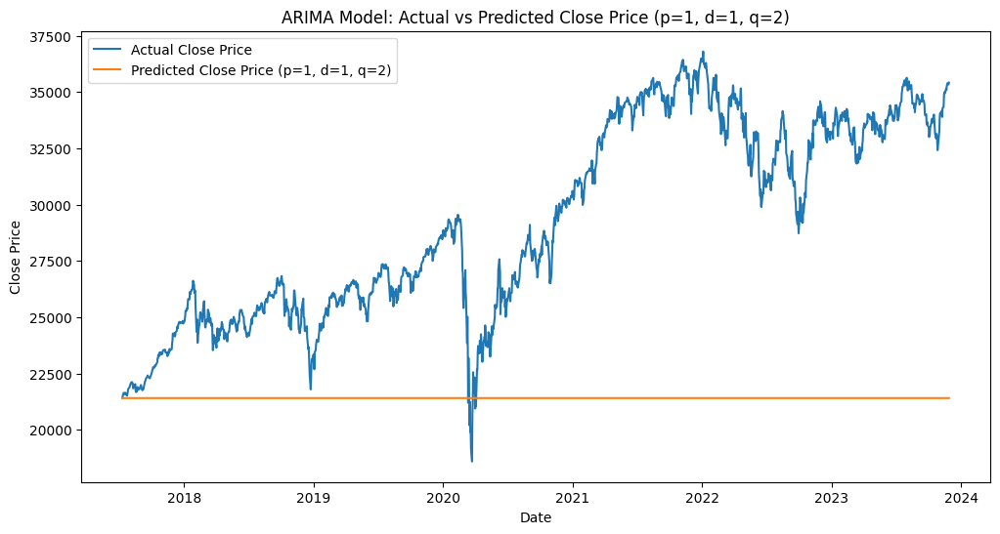

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=1, d=2, q=0): 307520299.9966431
Root Mean Squared Error (RMSE): 17536.256727039643


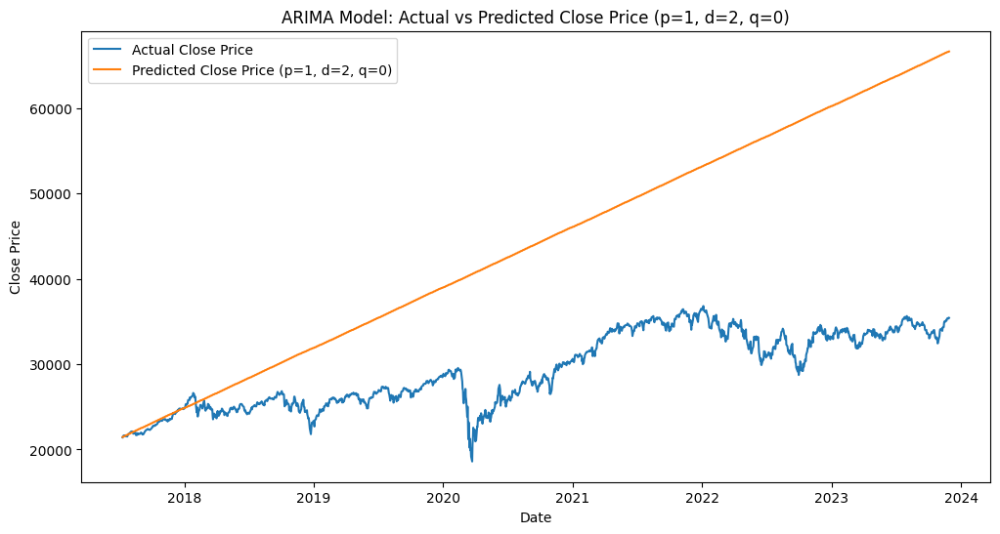

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=1, d=2, q=1): 33900244.00603406
Root Mean Squared Error (RMSE): 5822.391605348618


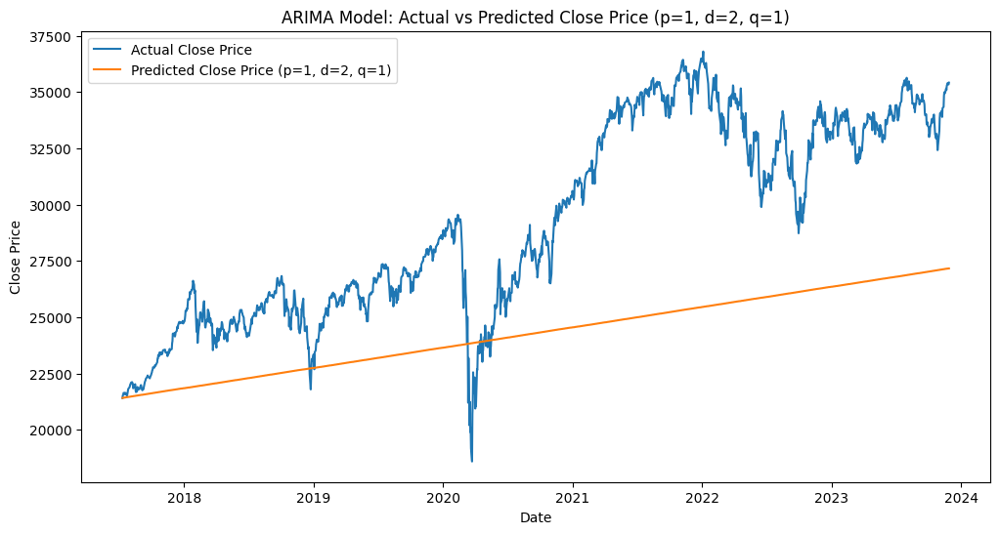

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=1, d=2, q=2): 39147696.88946822
Root Mean Squared Error (RMSE): 6256.812038847597


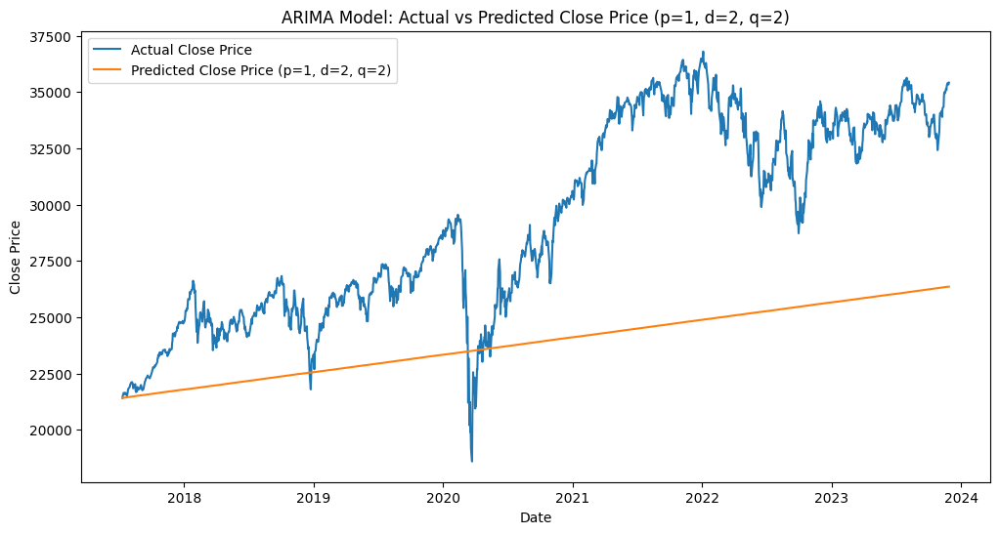

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=2, d=0, q=0): 82234732.72993772
Root Mean Squared Error (RMSE): 9068.336822700054


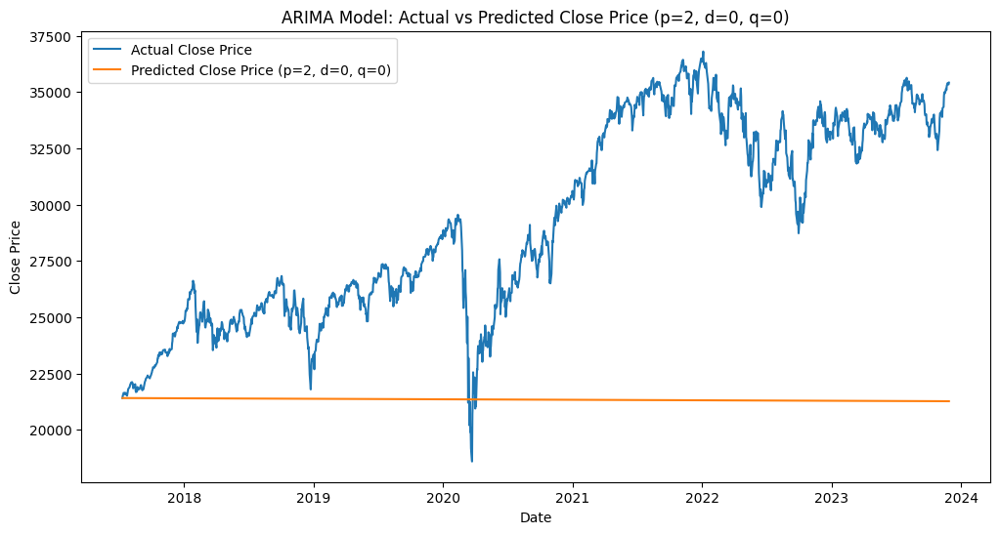

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=2, d=0, q=1): 98785919.11151074
Root Mean Squared Error (RMSE): 9939.11057949909


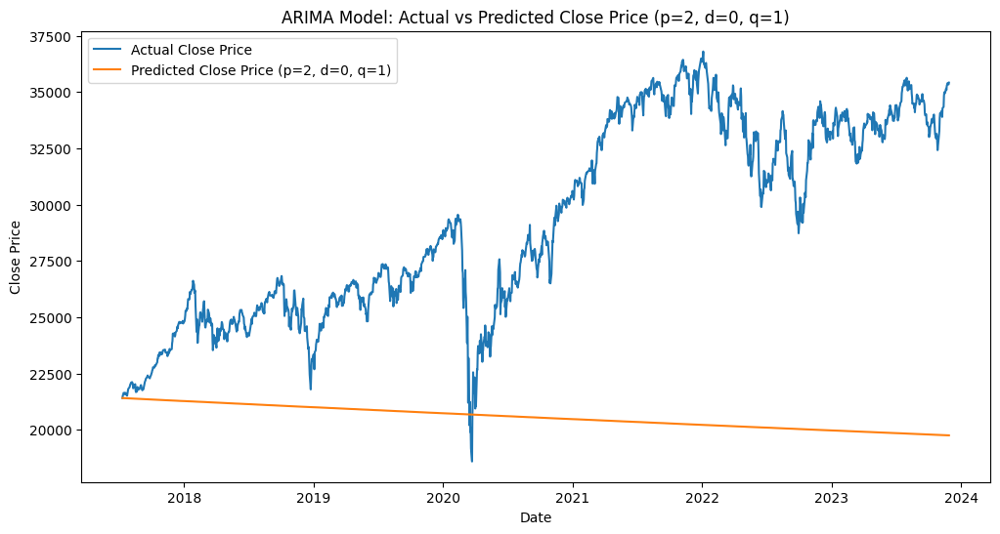

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=2, d=0, q=2): 98780196.61663997
Root Mean Squared Error (RMSE): 9938.822697716263


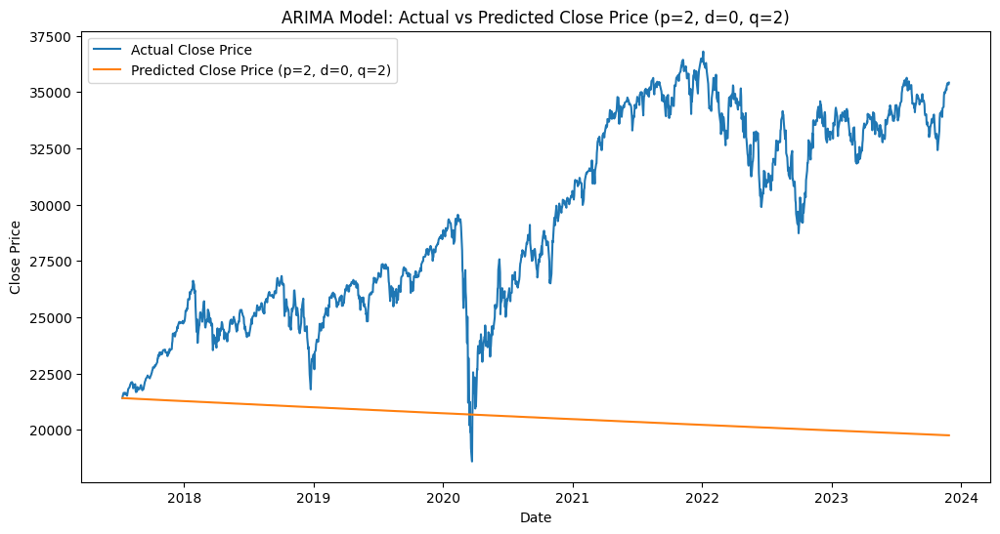

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=2, d=1, q=0): 80852552.7479331
Root Mean Squared Error (RMSE): 8991.804754771598


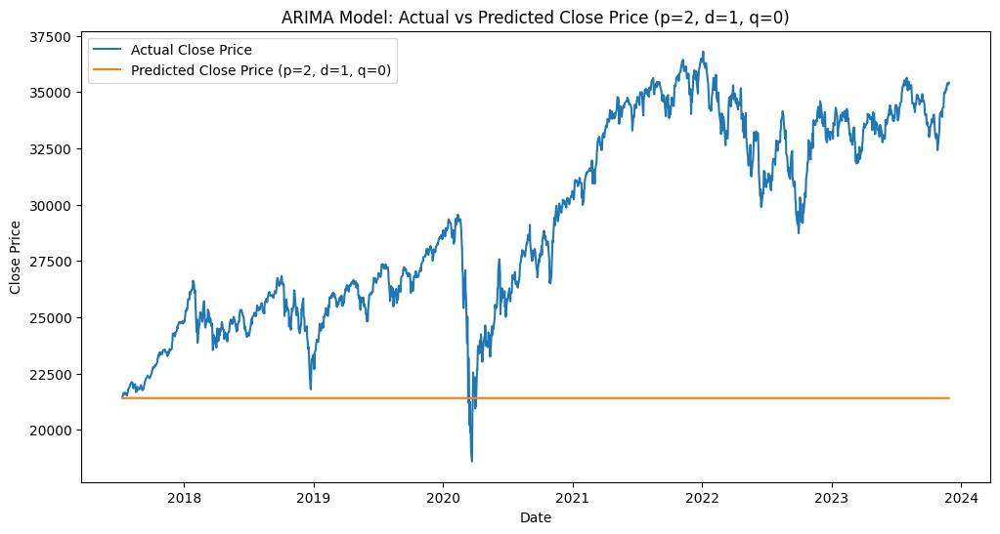

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=2, d=1, q=1): 80859068.97511914
Root Mean Squared Error (RMSE): 8992.167090035591


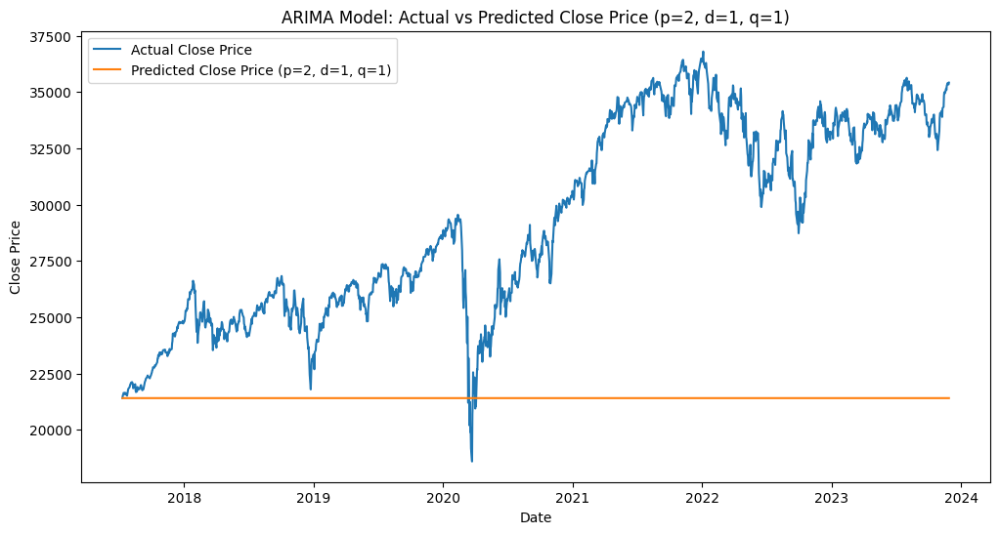

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=2, d=1, q=2): 80879189.96592943
Root Mean Squared Error (RMSE): 8993.285826989457


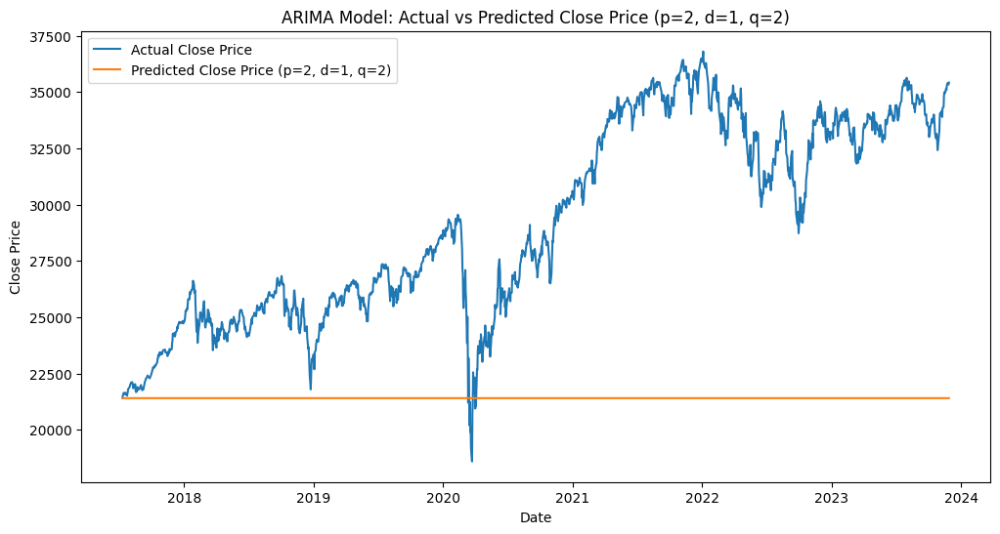

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=2, d=2, q=0): 64241886.699558124
Root Mean Squared Error (RMSE): 8015.103661186056


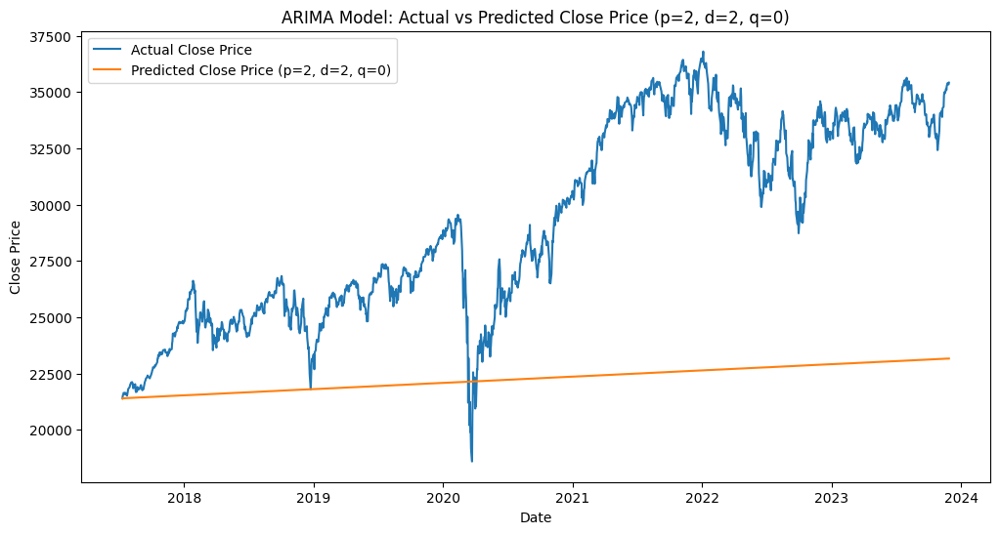

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=2, d=2, q=1): 41716147.164615124
Root Mean Squared Error (RMSE): 6458.803849368327


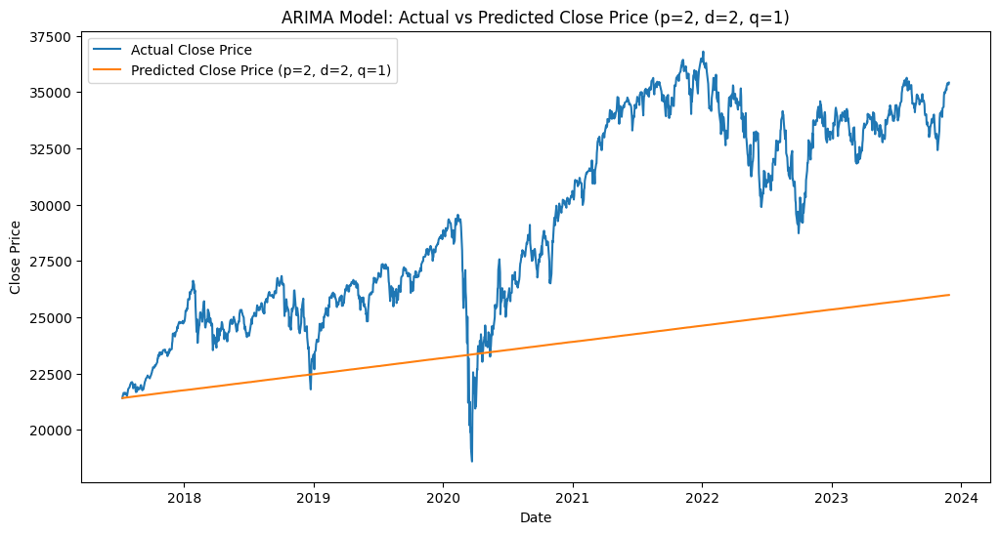

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


Mean Squared Error (MSE) (p=2, d=2, q=2): 41736112.10286367
Root Mean Squared Error (RMSE): 6460.3492245283205


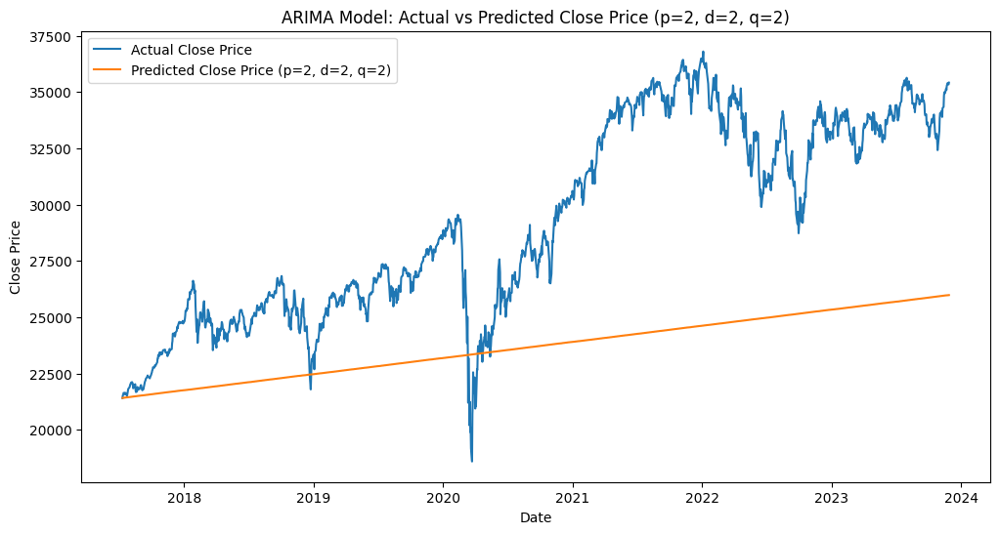

Best Mean Squared Error (MSE): 27353804.6555172 with order: (0, 2, 1)


In [ ]:
# Define the p, d, and q parameters to take any value between 0 and 2
p = d = q = range(0, 3)

# Generate all different combinations of p, d and q triplets
pdq = list(itertools.product(p, d, q))

best_mse = np.inf
best_order = None

# Iterate through different combinations and try to improve the model
for order in pdq:
    try:
        model = ARIMA(train, order=order)
        model_fit = model.fit()
        predictions = model_fit.predict(start=len(train), end=len(train) + len(test) - 1, typ='levels')

        mse = mean_squared_error(test, predictions)
        print(f'Mean Squared Error (MSE) (p={order[0]}, d={order[1]}, q={order[2]}): {mse}')
        rmse = np.sqrt(mse)
        print(f'Root Mean Squared Error (RMSE): {rmse}')

        if mse < best_mse:
            best_mse = mse
            best_order = order

        # Plot the actual vs. predicted close prices
        plt.figure(figsize=(12, 6))
        plt.plot(df.index[-len(test):], test, label='Actual Close Price')
        plt.plot(df.index[-len(test):], predictions, label=f'Predicted Close Price (p={order[0]}, d={order[1]}, q={order[2]})')
        plt.xlabel('Date')
        plt.ylabel('Close Price')
        plt.title(f'ARIMA Model: Actual vs Predicted Close Price (p={order[0]}, d={order[1]}, q={order[2]})')
        plt.legend()
        plt.show()

    except Exception as e:
        print(f'Error for order {order}: {str(e)}')

print(f'Best Mean Squared Error (MSE): {best_mse} with order: {best_order}')

## Prediciting what can be DJIA 'Close' next week using LSTM

In [ ]:
data = df['Close'].values.reshape(-1, 1)

#Normalizing the data
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data)

In [ ]:
def create_sequences(data, seq_length, target_day):
    X, y = [], []
    for i in range(len(data) - seq_length - target_day + 1):
        seq = data[i:i+seq_length, 0]
        target = data[i+seq_length+target_day-1, 0]
        X.append(seq)
        y.append(target)
    return np.array(X), np.array(y)

seq_length = 10
target_day = 7  # Predict 7th day ahead
X, y = create_sequences(data_scaled, seq_length, target_day)

# Train-Test Split
split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

### LSTM Architecture

In [ ]:
model = Sequential()
model.add(LSTM(units=50, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], 1)))
model.add(LSTM(units=50, activation='relu', return_sequences=True))
model.add(LSTM(units=50, activation='relu'))
model.add(Dense(units=1))

model.compile(optimizer='adam', loss='mean_squared_error')

model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=1)

Epoch 1/100
201/201 [==============================] - 15s 26ms/step - loss: 0.0049
Epoch 2/100
201/201 [==============================] - 3s 17ms/step - loss: 1.1117e-04
Epoch 3/100
201/201 [==============================] - 5s 25ms/step - loss: 1.2159e-04
Epoch 4/100
201/201 [==============================] - 3s 15ms/step - loss: 1.1410e-04
Epoch 5/100
201/201 [==============================] - 3s 16ms/step - loss: 1.0886e-04
Epoch 6/100
201/201 [==============================] - 3s 15ms/step - loss: 1.1598e-04
Epoch 7/100
201/201 [==============================] - 5s 25ms/step - loss: 1.1737e-04
Epoch 8/100
201/201 [==============================] - 7s 36ms/step - loss: 1.1034e-04
Epoch 9/100
201/201 [==============================] - 7s 37ms/step - loss: 1.1975e-04
Epoch 10/100
201/201 [==============================] - 7s 35ms/step - loss: 1.0990e-04
Epoch 11/100
201/201 [==============================] - 5s 26ms/step - loss: 1.1207e-04
Epoch 12/100
201/201 [======================

In [ ]:
from sklearn.metrics import mean_squared_error

predictions = model.predict(X_test)

predicted_prices = scaler.inverse_transform(predictions[:, -1].reshape(-1, 1))
actual_prices = scaler.inverse_transform(y_test.reshape(-1, 1))

mse = mean_squared_error(actual_prices, predicted_prices)
print(f'Mean Squared Error: {mse}')
rmse = np.sqrt(mse)
print(f'Root Mean Squared Error (RMSE): {rmse}')

51/51 [==============================] - 1s 5ms/step
Mean Squared Error: 848586.3903616695
Root Mean Squared Error (RMSE): 921.1874892559438


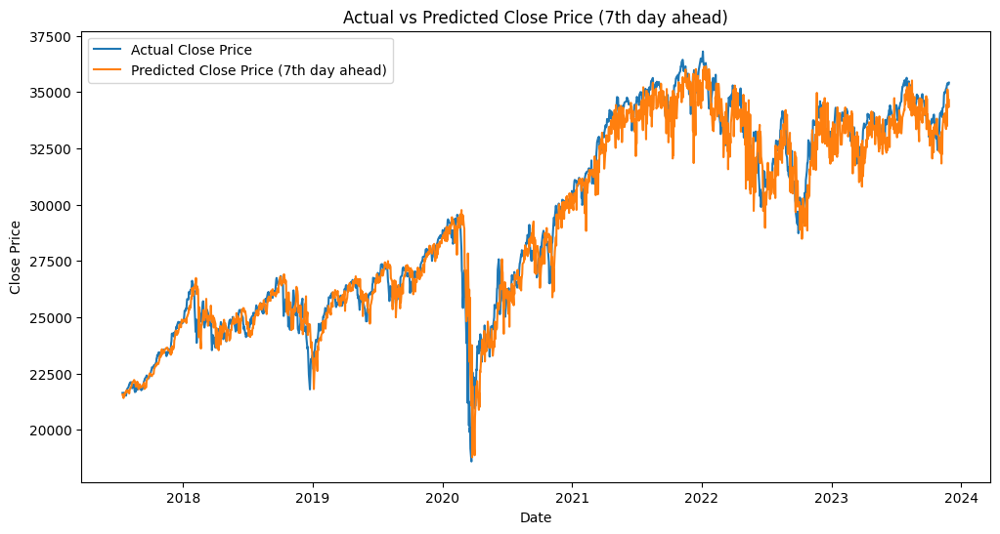

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(df.index[-len(predictions):], actual_prices, label='Actual Close Price')
plt.plot(df.index[-len(predictions):], predicted_prices, label=f'Predicted Close Price (7th day ahead)')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title(f'Actual vs Predicted Close Price ({target_day}th day ahead)')
plt.legend()
plt.show()